In [36]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, Normalize
import numpy as np
from scipy.interpolate import interp1d
import astropy.units as u
import sunpy.sun.constants as sun_const
from astropy.visualization import quantity_support
from astropy.coordinates import SkyCoord

import synthesizAR
from pydrad.configure import Configure
from pydrad.parse import Strand

from hydrad_utils import config_from_bundle, configure_footpoint_heating

# Set Up HYDRAD Runs

Five cases:

1. Hydrostatic (no expansion)
2. Hydrostatic (w/ expansion)
3. TNE (no expansion)
4. Siphon flow (no expansion)
5. Siphon flow (w/ expansion)

Each loop will have the average loop length, gravitational profile, and magnetic field profile of all strands in the bundle.

In [2]:
bundle = synthesizAR.Skeleton.from_asdf('model_data/base_skeleton.asdf')

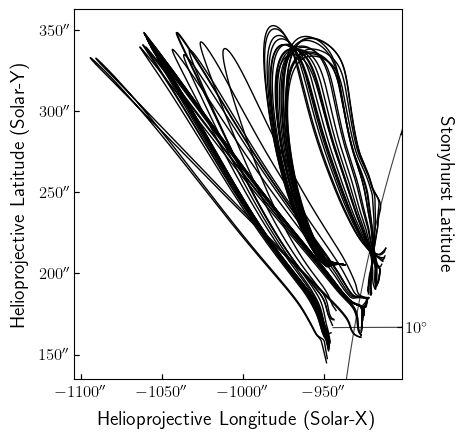

In [3]:
bundle.peek(observer=SkyCoord(lon=90*u.deg,
                              lat=0*u.deg,
                              radius=1*u.AU,
                              frame=bundle.loops[0].coordinate.replicate_without_data()))

I think it is safe to just assume a semi-circular gravitational profile for all of these loops. The behavior of the field line tracing near the boundary is clearly causing issues.

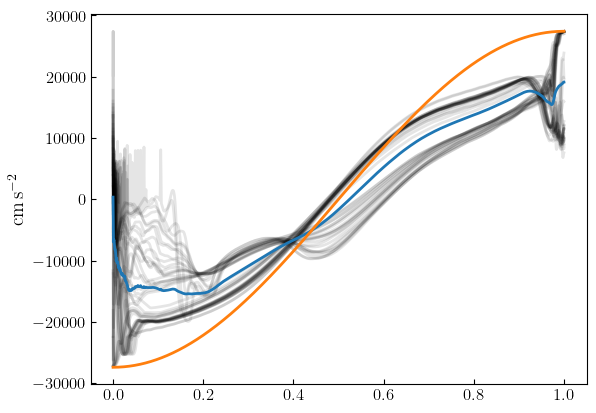

In [20]:
s_norm = np.linspace(0,1,1000)
with quantity_support():
    g_mean = []
    for strand in bundle.loops:
        plt.plot(strand.field_aligned_coordinate_norm, strand.gravity, color='k', alpha=0.1)
        g_mean.append(interp1d(strand.field_aligned_coordinate_norm, strand.gravity.to_value('cm s-2'),
                               fill_value='extrapolate')(s_norm))
    g_mean = u.Quantity(g_mean, 'cm s-2').mean(axis=0)
    plt.plot(s_norm, g_mean)
    g_sc = -np.cos(np.pi*s_norm)*sun_const.surface_gravity
    plt.plot(s_norm,g_sc, color='C1')

In [95]:
for strand in bundle.loops:
    print(strand.field_strength[-1]/strand.field_strength[0])

0.6829317989833098
0.781902312273127
0.6811577017819115
1.6580328829611728
1.1464801014188835
0.5143698715048394
3.1696727397069
1.5990843274475695
1.1332754915385614
0.5935122752461471
0.3731027656312556
0.42201775494990107
3.9321487363798164
0.5970902166670714
1.148746069477444
1.7802020055432275
2.3058530958838976
1.1270087415085903
0.3864951771362418
1.0957194248215048
0.892197722236965
2.518393520156103
1.1511930653420088
0.5622570034974794
2.0245649009629654
2.2690392466224005
2.4578871385058667
1.0099075502534904
0.4244129885576429
1.0447051055435677
0.6146233693115619
0.42168549240349795
1.7191500108606492
0.8802391601305887
1.144498389705197
0.5625652984971251
1.2603626815207831
0.81806551312473
0.49469617629551066
0.5737727297336962
2.312660034141736
1.2039950740329655
0.9942619320696031
0.9924618638615804
0.7394476456435134
2.1587824901663666
0.9477440608713256


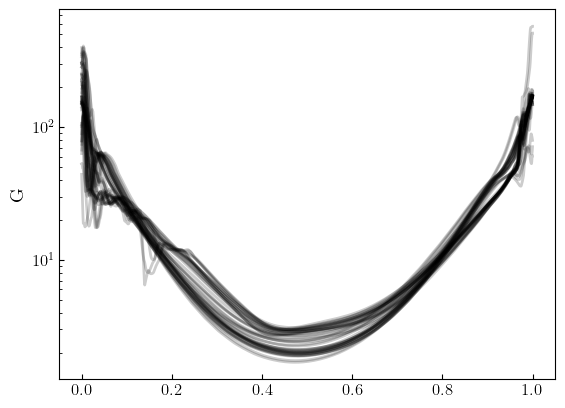

In [5]:
with quantity_support():
    for strand in bundle.loops:
        plt.plot(strand.field_aligned_coordinate_norm, strand.field_strength, color='k', alpha=0.2)
    plt.yscale('log')

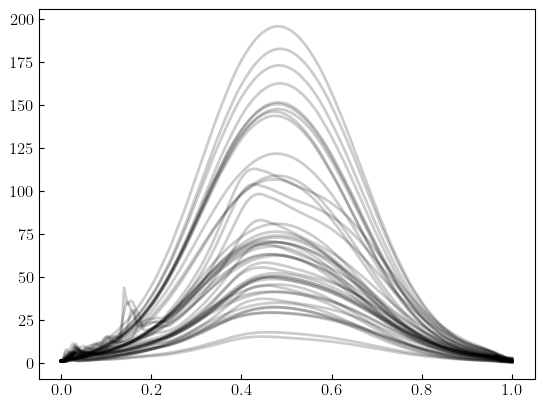

In [6]:
with quantity_support():
    for strand in bundle.loops:
        plt.plot(strand.field_aligned_coordinate_norm, strand.field_strength[0]/strand.field_strength, color='k', alpha=0.2)
    #plt.yscale('log')

In [112]:
hydrad_config = Configure.load_config('model_data/base-hydrad-config.asdf')
# modify the base config file to include these...
hydrad_config['general']['total_time'] = 2 * u.day
hydrad_config['general']['heat_flux_timestep_limit'] = 1e-3 * u.s  # This may be dicey 
hydrad_config['grid']['minimum_fractional_difference'] = 0.1
hydrad_config['grid']['maximum_fractional_difference'] = 0.2
hydrad_config['grid']['refine_on_electron_energy'] = False
hydrad_config['general']['output_interval'] = 5 * u.minute

## Run 1: Hydrostatic (no events) with no expansion

In [113]:
run_1_config = config_from_bundle(hydrad_config, bundle, include_expansion=False, include_gravity=True)
run_1_config['initial_conditions']['use_poly_fit_gravity'] = True
run_1_config['initial_conditions']['footpoint_density'] = 2e10 * u.Unit('cm-3')
run_1_config['heating']['events'] = []
c = Configure(run_1_config)
c.setup_simulation('model_data/hydrad_runs/run_1',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szPHYFilename, "%s.phy", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/misc.cpp:309:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szSOLFilename, "%s.sol", Params.szOutputFilename );
^
/L

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 6.0256e-06 -> 6.1660e-06 erg cm^-3 s^-1

Optimum peak heating rate = 6.1088e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [32]:
run_1_strand = Strand('model_data/hydrad_runs/run_1/')

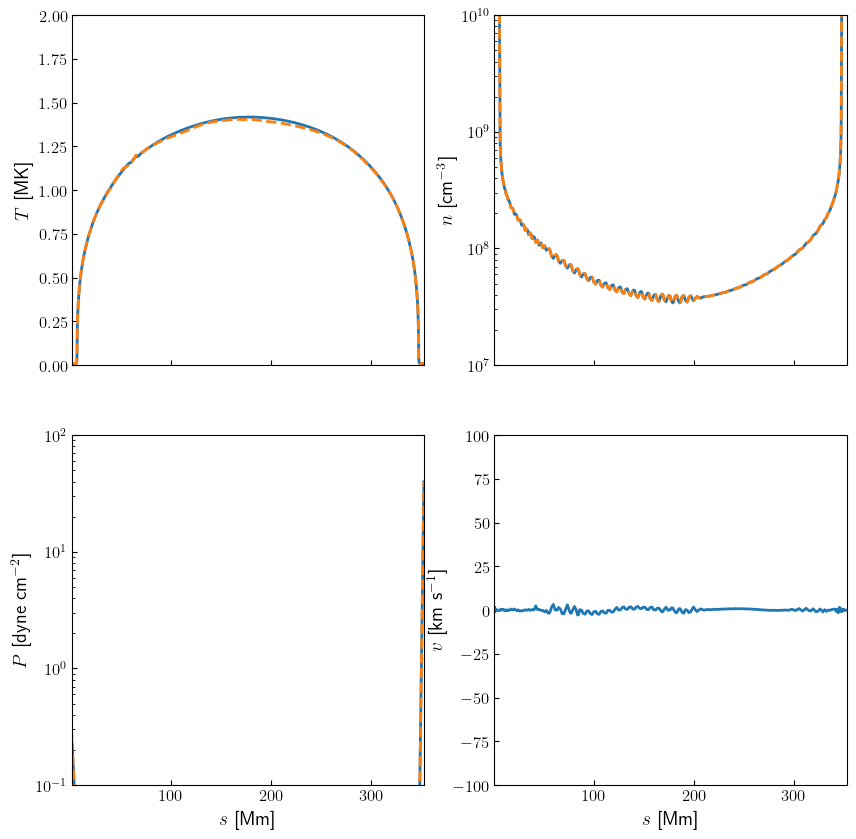

In [33]:
run_1_strand[-1].peek(limits={'temperature': [0,2],
                                             'density': [1e7,1e10]})

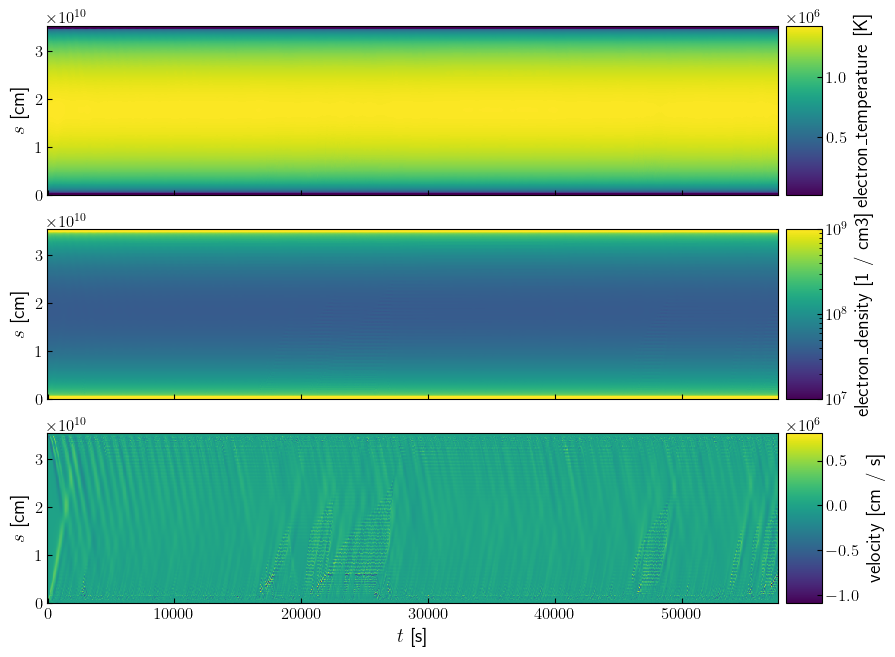

In [34]:
run_1_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e7, vmax=1e9)}
)

## Run 2: Hydrostatic (no events) with expansion

In [114]:
run_2_config = config_from_bundle(hydrad_config, bundle, include_expansion=True, include_gravity=True)
run_2_config['initial_conditions']['use_poly_fit_gravity'] = True
run_2_config['initial_conditions']['use_poly_fit_magnetic_field'] = True
# Adjusting this value to get close to an apex temperature of 1.3 MK
run_2_config['initial_conditions']['footpoint_density'] = 4e10 * u.Unit('cm-3')
run_2_config['heating']['events'] = []
c = Configure(run_2_config)
c.setup_simulation('model_data/hydrad_runs/run_2',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szPHYFilename, "%s.phy", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/misc.cpp:309:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szSOLFilename, "%s.sol", Params.szOutputFilename );
^
/L

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 1.8621e-06 -> 1.9055e-06 erg cm^-3 s^-1

Optimum peak heating rate = 1.8957e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [29]:
run_2_strand = Strand('model_data/hydrad_runs/run_2/')

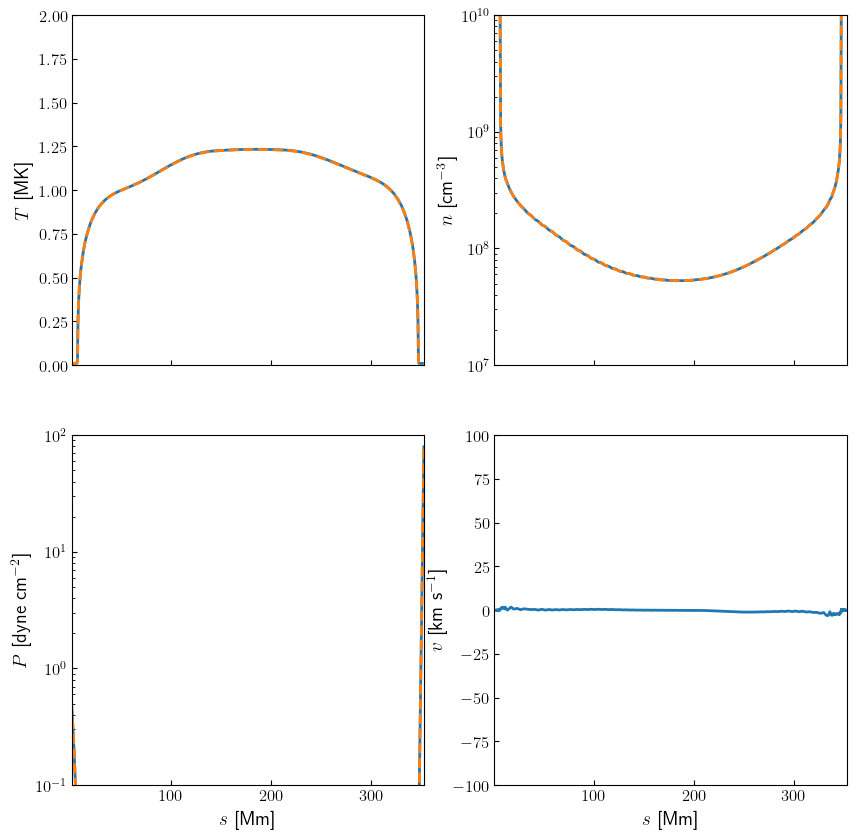

In [83]:
run_2_strand[-1].peek(limits={'temperature': [0,2],
                                             'density': [1e7,1e10]})

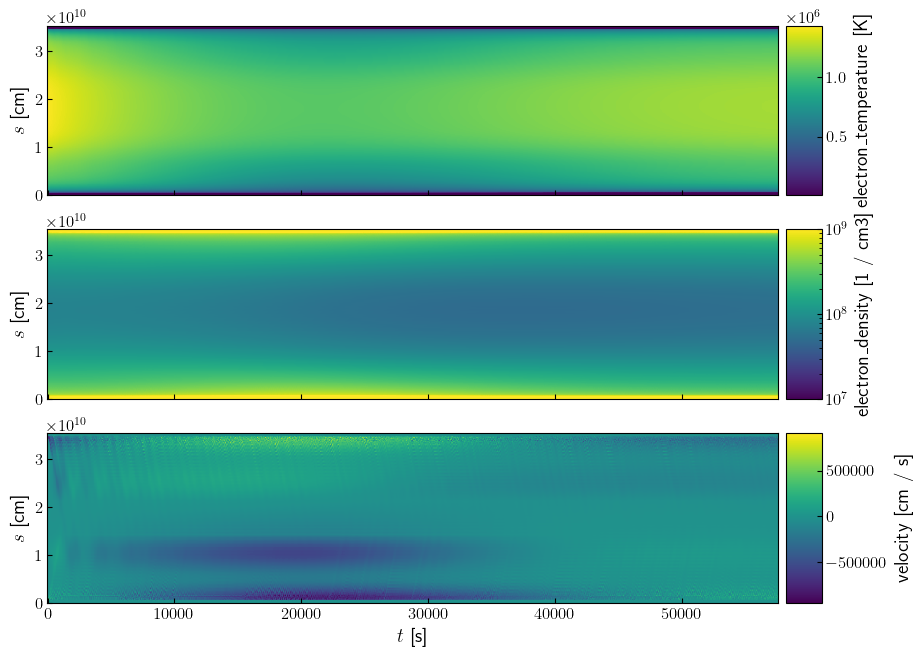

In [31]:
run_2_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e7, vmax=1e9)}
)

## Run 3: Thermal Non-equilibrium

In [57]:
q_0 = 0.02 * u.Unit('erg cm-3 s-1') * (2/3)**(7/2)  # Reduce peak temperature from 3 to 2 MK
scale_height_ratio = 0.01
deposition_ratio = 12.5 / 180  # I previously determined this value of stratification leads to TNE

In [58]:
run_3_config = config_from_bundle(hydrad_config, bundle, include_expansion=True, include_gravity=True)
run_3_config['heating']['background']['use_initial_conditions'] = False
run_3_config['heating']['background']['rate'] = 0 * u.Unit('erg cm-3 s-1')
run_3_config['heating']['background']['location'] = 0 * u.cm
run_3_config['heating']['background']['scale_height'] = 1e300 * u.cm
run_3_config['heating']['events'] = configure_footpoint_heating(run_3_config,
                                                                q_0,
                                                                sh_ratio=scale_height_ratio,
                                                                deposition_ratio=deposition_ratio,
                                                                fp_ratio=0.5)
c = Configure(run_3_config)
c.setup_simulation('model_data/hydrad_runs/run_3',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szGravityTableFilename, "%s.table", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/main.cpp:92:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szGravityFilename, "%s.gravity", Params.szOutp

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 8.1283e-06 -> 8.3176e-06 erg cm^-3 s^-1

Optimum peak heating rate = 8.1593e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [61]:
run_3_strand = Strand('model_data/hydrad_runs/run_3/')

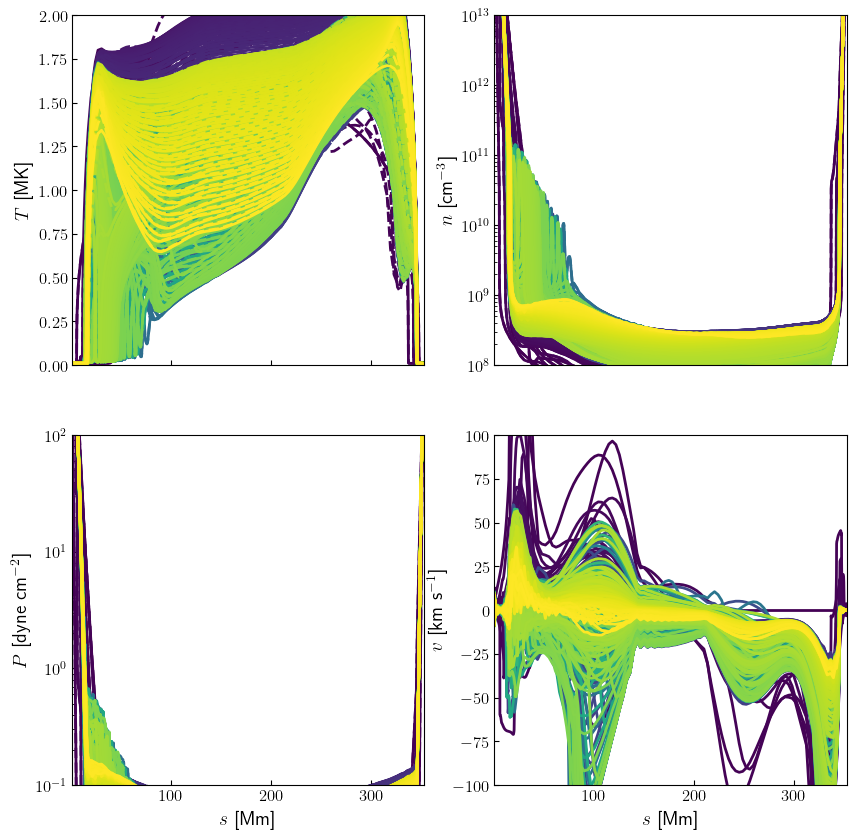

In [92]:
run_3_strand.peek(limits={'temperature': [0,2]})

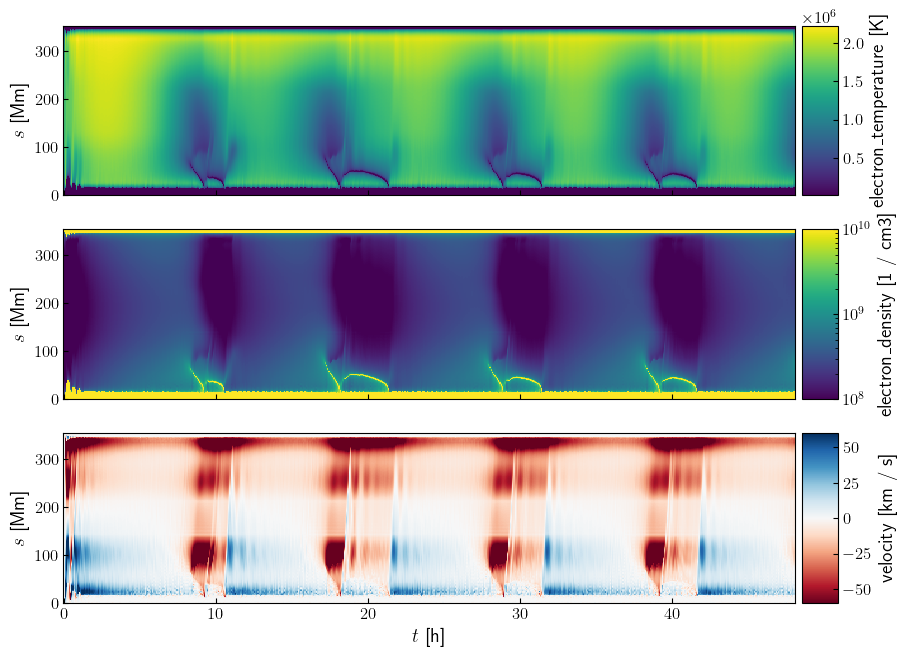

In [64]:
run_3_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
    time_unit='h',
    space_unit='Mm'
)

In [65]:
indices = np.where(np.logical_and(run_3_strand.time>25*u.h,
                                  run_3_strand.time<35*u.h))

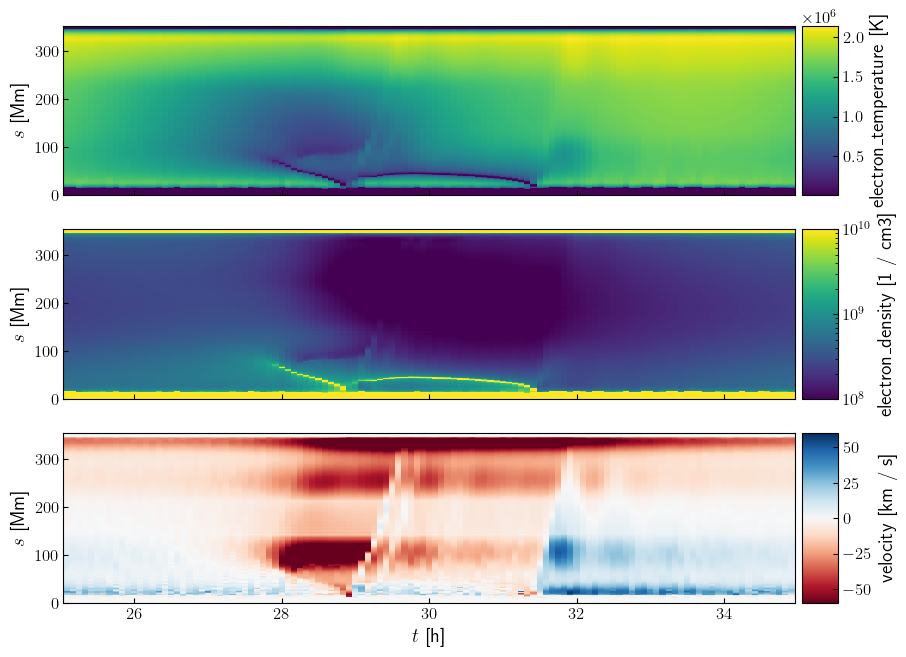

In [76]:
run_3_strand[indices].peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
    time_unit='h',
    space_unit='Mm'
)

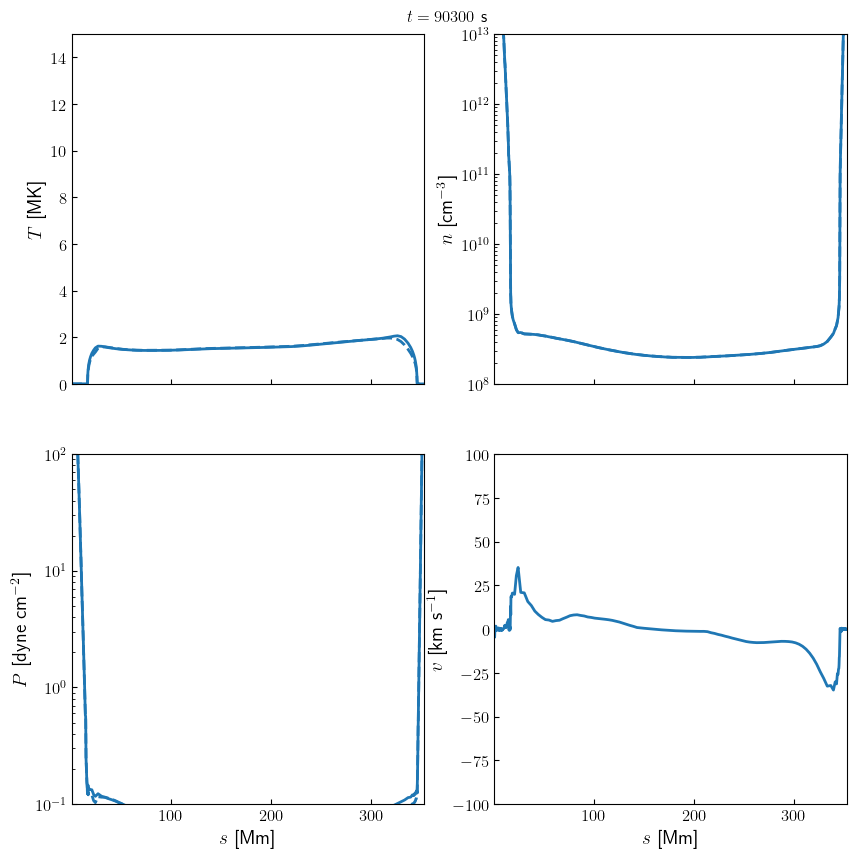

In [69]:
ani = run_3_strand[301:419].animate()

In [70]:
from IPython.display import HTML

In [71]:
HTML(ani.to_jshtml())

## Run 4: Siphon flow (w/o expansion)

In [59]:
run_4_config = config_from_bundle(hydrad_config, bundle, include_expansion=False, include_gravity=True)
run_4_config['general']['total_time'] = 2 * u.day
run_4_config['heating']['background']['use_initial_conditions'] = False
run_4_config['heating']['background']['rate'] = 0 * u.Unit('erg cm-3 s-1')
run_4_config['heating']['background']['location'] = 0 * u.cm
run_4_config['heating']['background']['scale_height'] = 1e300 * u.cm
run_4_config['heating']['events'] = configure_footpoint_heating(run_4_config,
                                                                q_0,
                                                                sh_ratio=scale_height_ratio,
                                                                deposition_ratio=deposition_ratio,
                                                                fp_ratio=0)
c = Configure(run_4_config)
c.setup_simulation('model_data/hydrad_runs/run_4',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szGravityTableFilename, "%s.table", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/main.cpp:92:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szGravityFilename, "%s.gravity", Params.szOutp

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 8.1283e-06 -> 8.3176e-06 erg cm^-3 s^-1

Optimum peak heating rate = 8.1593e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [77]:
run_4_strand = Strand('model_data/hydrad_runs/run_4/')

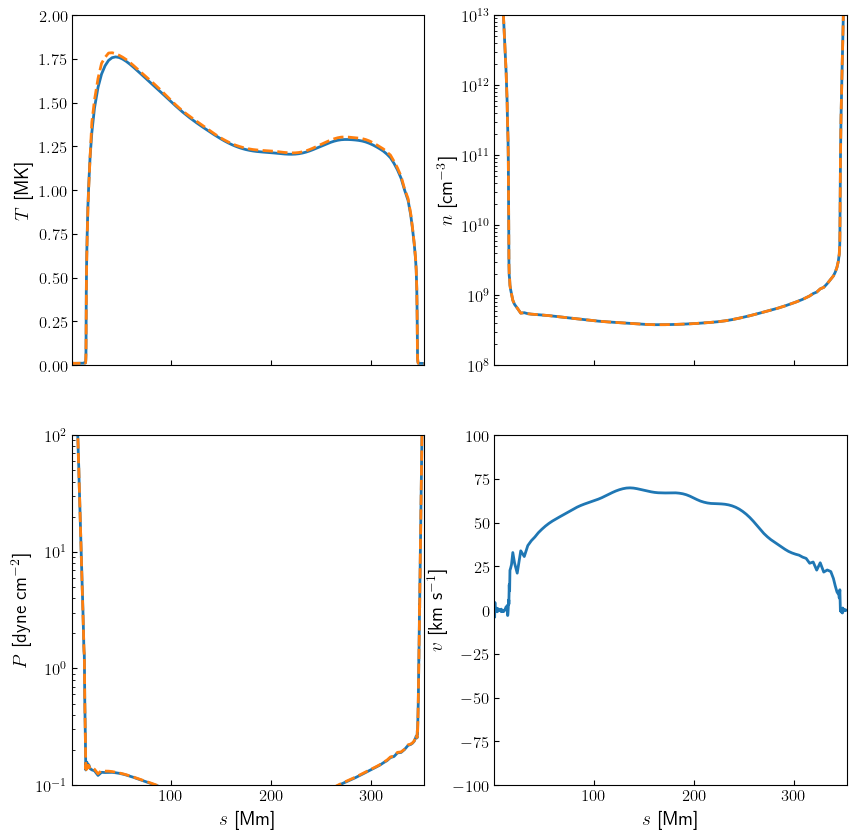

In [78]:
run_4_strand[-1].peek(limits={'temperature': [0,2]})

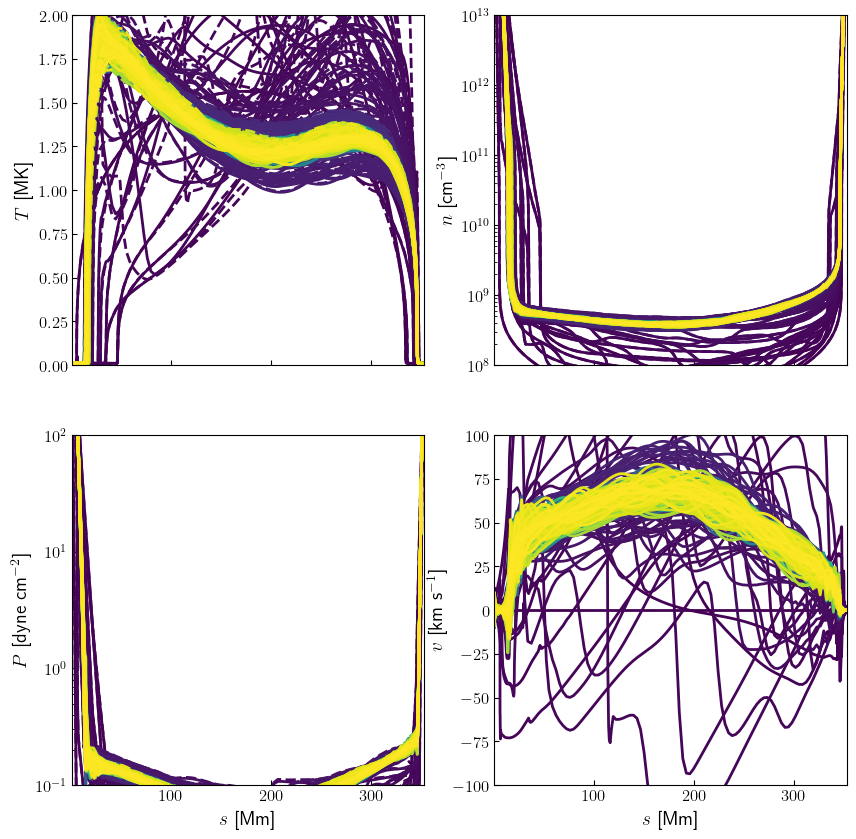

In [97]:
run_4_strand.peek(limits={'temperature': [0,2]})

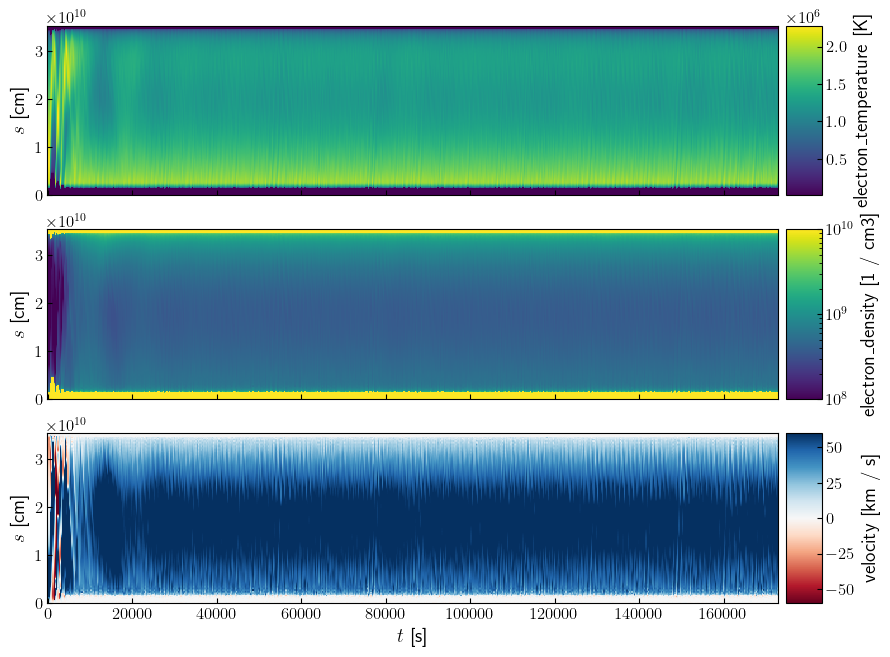

In [79]:
run_4_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
)

## Run 5: Siphon flow (w/ expansion)

In [60]:
run_5_config = config_from_bundle(hydrad_config, bundle, include_expansion=True, include_gravity=True)
run_5_config['general']['total_time'] = 2 * u.day
run_5_config['heating']['background']['use_initial_conditions'] = False
run_5_config['heating']['background']['rate'] = 0 * u.Unit('erg cm-3 s-1')
run_5_config['heating']['background']['location'] = 0 * u.cm
run_5_config['heating']['background']['scale_height'] = 1e300 * u.cm
run_5_config['heating']['events'] = configure_footpoint_heating(run_5_config,
                                                                q_0,
                                                                sh_ratio=scale_height_ratio,
                                                                deposition_ratio=deposition_ratio,
                                                                fp_ratio=0)
c = Configure(run_5_config)
c.setup_simulation('model_data/hydrad_runs/run_5',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szGravityTableFilename, "%s.table", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/main.cpp:92:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szGravityFilename, "%s.gravity", Params.szOutp

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 8.1283e-06 -> 8.3176e-06 erg cm^-3 s^-1

Optimum peak heating rate = 8.1593e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [80]:
run_5_strand = Strand('model_data/hydrad_runs/run_5/')

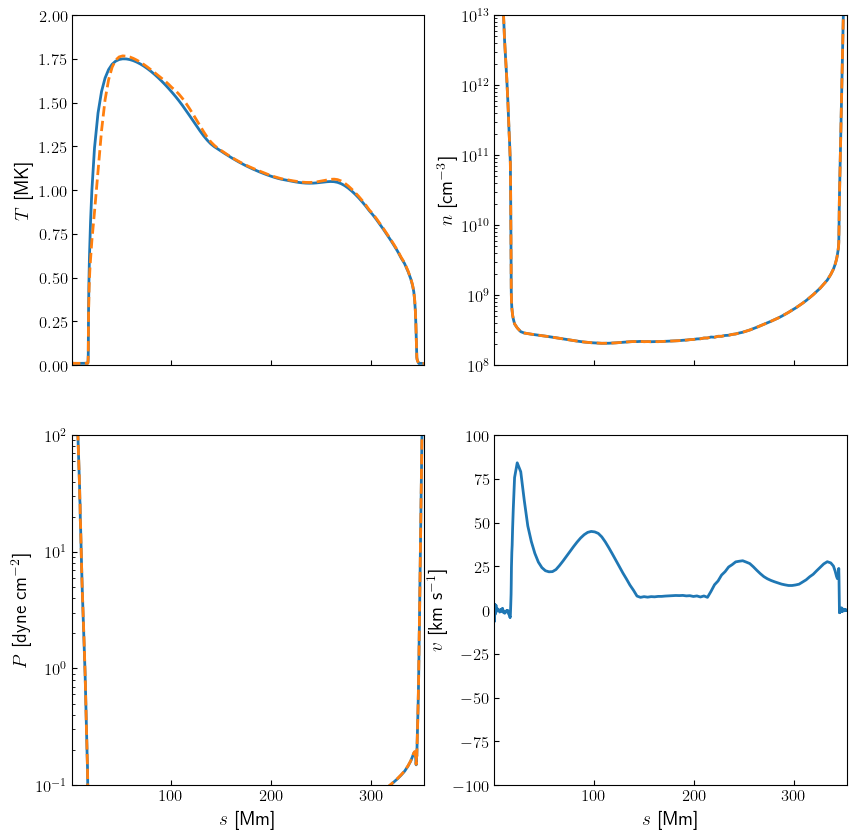

In [81]:
run_5_strand[-1].peek(limits={'temperature': [0,2]})

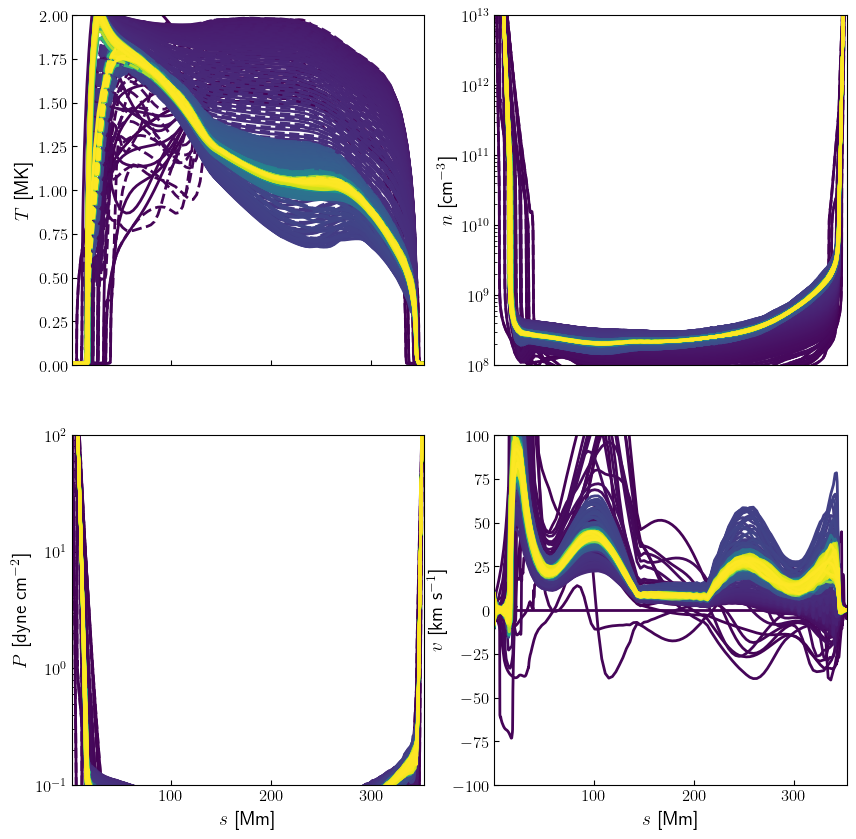

In [109]:
run_5_strand.peek(limits={'temperature': [0,2]})

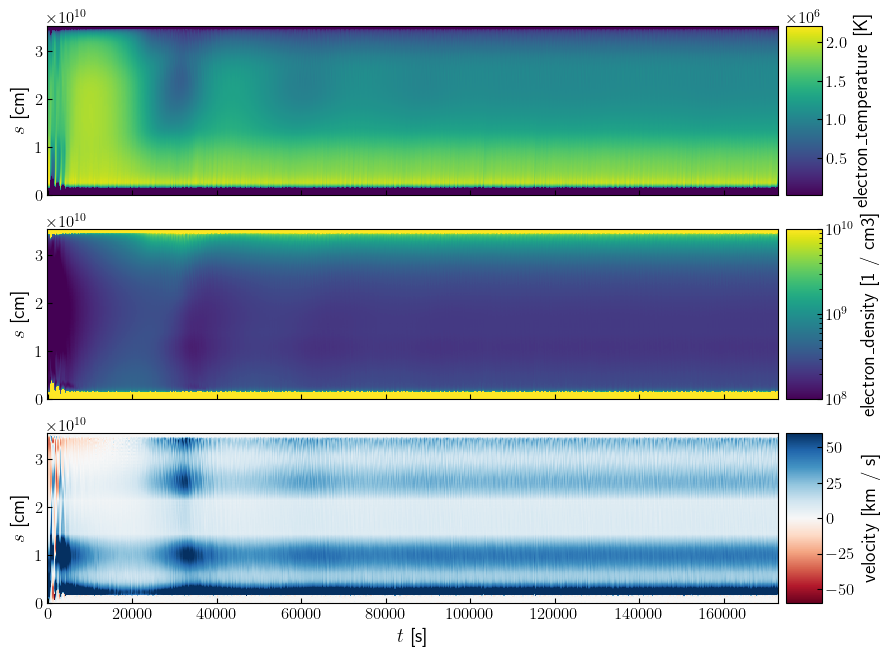

In [82]:
run_5_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
)

## Run 6: TNE w/o Expansion

In [83]:
run_6_config = config_from_bundle(hydrad_config, bundle, include_expansion=False, include_gravity=True)
run_6_config['general']['total_time'] = 2 * u.day
run_6_config['heating']['background']['use_initial_conditions'] = False
run_6_config['heating']['background']['rate'] = 0 * u.Unit('erg cm-3 s-1')
run_6_config['heating']['background']['location'] = 0 * u.cm
run_6_config['heating']['background']['scale_height'] = 1e300 * u.cm
run_6_config['heating']['events'] = configure_footpoint_heating(run_6_config,
                                                                q_0,
                                                                sh_ratio=scale_height_ratio,
                                                                deposition_ratio=deposition_ratio,
                                                                fp_ratio=0.5)
c = Configure(run_6_config)
c.setup_simulation('model_data/hydrad_runs/run_6',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szGravityTableFilename, "%s.table", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/main.cpp:92:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szGravityFilename, "%s.gravity", Params.szOutp

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 8.1283e-06 -> 8.3176e-06 erg cm^-3 s^-1

Optimum peak heating rate = 8.1593e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [85]:
run_6_strand = Strand('model_data/hydrad_runs/run_6/')

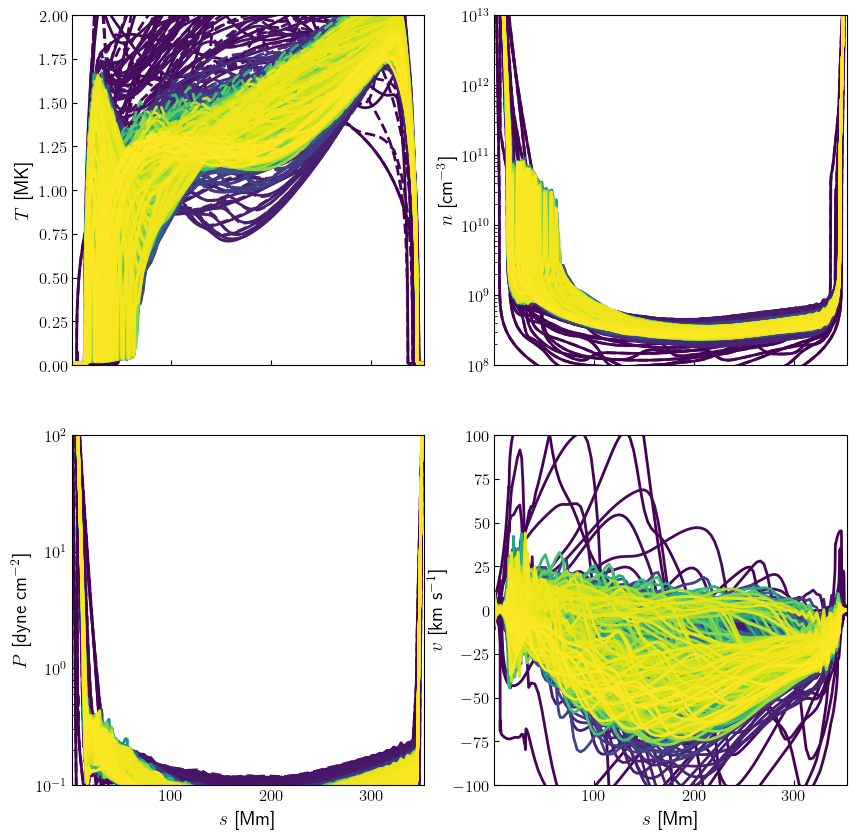

In [93]:
run_6_strand.peek(limits={'temperature': [0,2]})

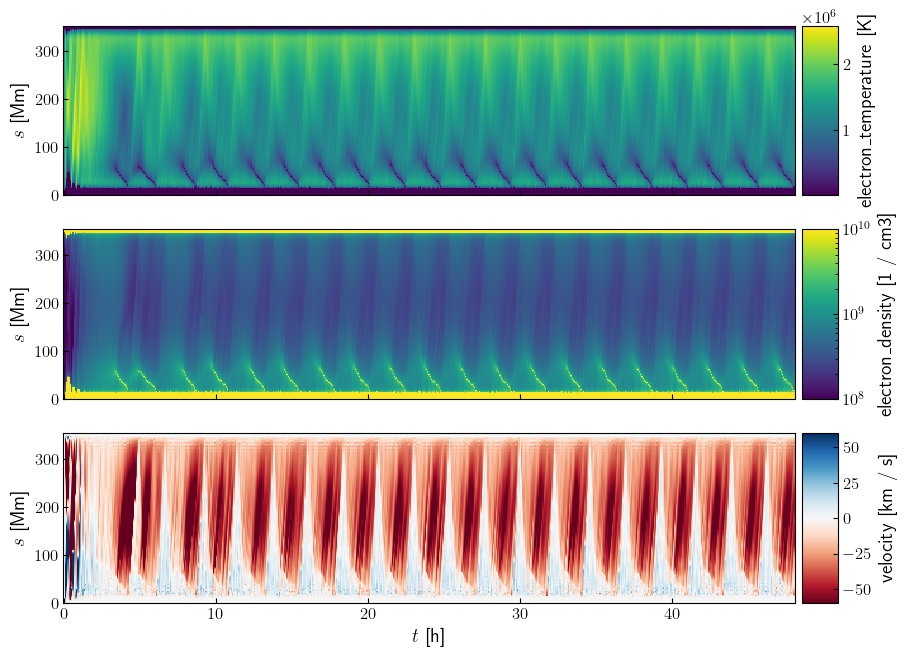

In [88]:
run_6_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
    time_unit='h',
    space_unit='Mm',
)

## Run 7: Reduced Siphon Flow (w/o expansion)

Here, I've reduced the FP heating asymmetry such that it's halfway between a siphon flow and TNE scenario

In [84]:
run_7_config = config_from_bundle(hydrad_config, bundle, include_expansion=False, include_gravity=True)
run_7_config['general']['total_time'] = 2 * u.day
run_7_config['heating']['background']['use_initial_conditions'] = False
run_7_config['heating']['background']['rate'] = 0 * u.Unit('erg cm-3 s-1')
run_7_config['heating']['background']['location'] = 0 * u.cm
run_7_config['heating']['background']['scale_height'] = 1e300 * u.cm
run_7_config['heating']['events'] = configure_footpoint_heating(run_7_config,
                                                                q_0,
                                                                sh_ratio=scale_height_ratio,
                                                                deposition_ratio=deposition_ratio,
                                                                fp_ratio=0.25)
c = Configure(run_7_config)
c.setup_simulation('model_data/hydrad_runs/run_7',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szGravityTableFilename, "%s.table", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/main.cpp:92:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szGravityFilename, "%s.gravity", Params.szOutp

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 8.1283e-06 -> 8.3176e-06 erg cm^-3 s^-1

Optimum peak heating rate = 8.1593e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [89]:
run_7_strand = Strand('model_data/hydrad_runs/run_7/')

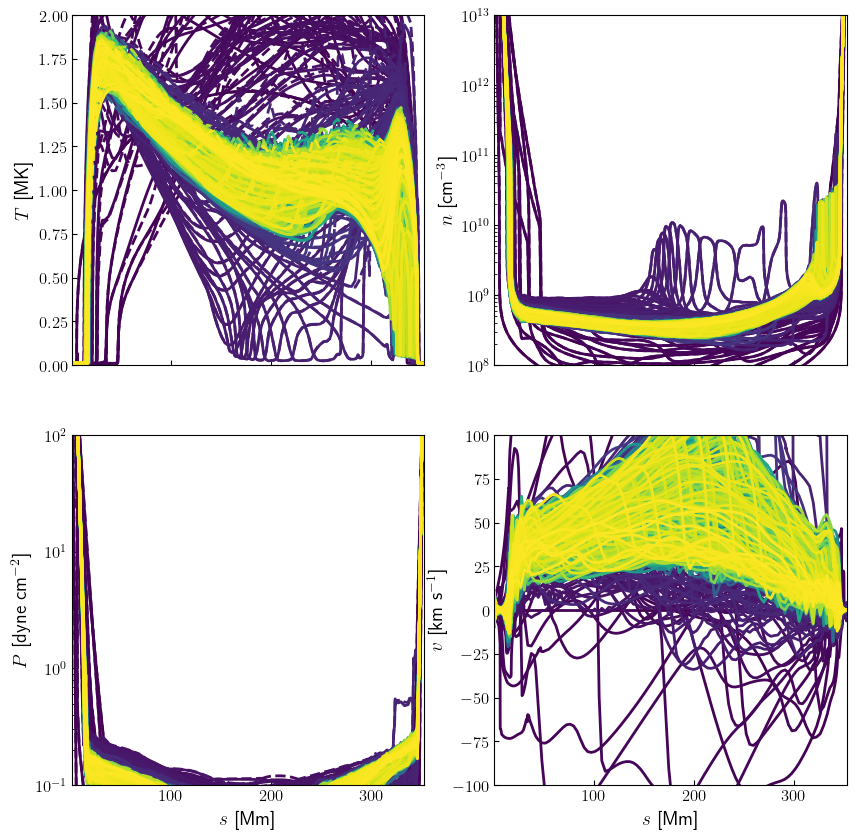

In [91]:
run_7_strand.peek(limits={'temperature': [0,2]})

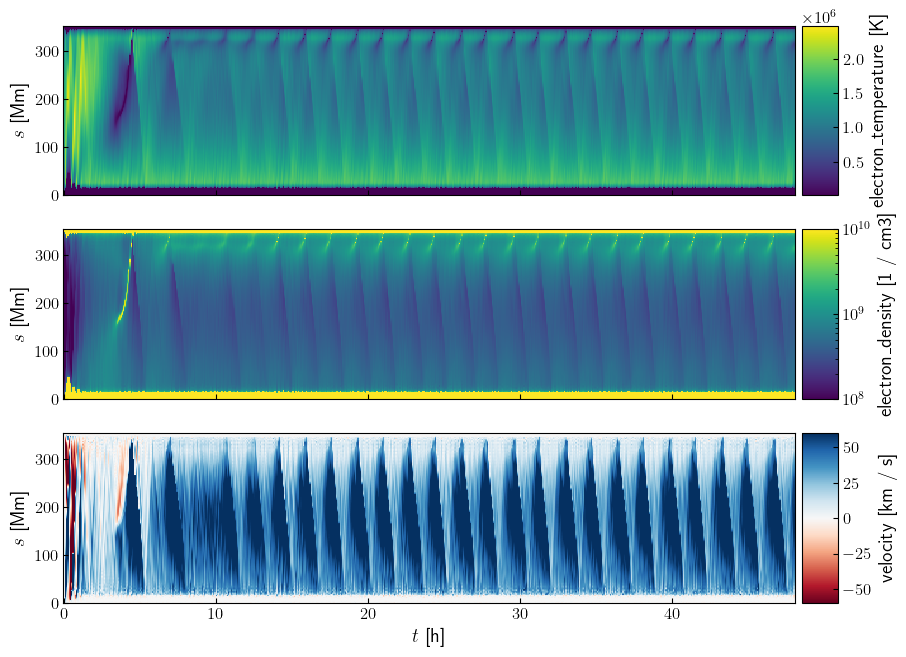

In [90]:
run_7_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
    time_unit='h',
    space_unit='Mm',
)

## Run 8: More reduced (closer to symmetric) siphon flow (w/o expansion)

In [96]:
run_8_config = config_from_bundle(hydrad_config, bundle, include_expansion=False, include_gravity=True)
run_8_config['general']['total_time'] = 2 * u.day
run_8_config['heating']['background']['use_initial_conditions'] = False
run_8_config['heating']['background']['rate'] = 0 * u.Unit('erg cm-3 s-1')
run_8_config['heating']['background']['location'] = 0 * u.cm
run_8_config['heating']['background']['scale_height'] = 1e300 * u.cm
run_8_config['heating']['events'] = configure_footpoint_heating(run_8_config,
                                                                q_0,
                                                                sh_ratio=scale_height_ratio,
                                                                deposition_ratio=deposition_ratio,
                                                                fp_ratio=0.35)
c = Configure(run_8_config)
c.setup_simulation('model_data/hydrad_runs/run_8',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szGravityTableFilename, "%s.table", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/main.cpp:92:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szGravityFilename, "%s.gravity", Params.szOutp

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 8.1283e-06 -> 8.3176e-06 erg cm^-3 s^-1

Optimum peak heating rate = 8.1593e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [98]:
run_8_strand = Strand('model_data/hydrad_runs/run_8/')

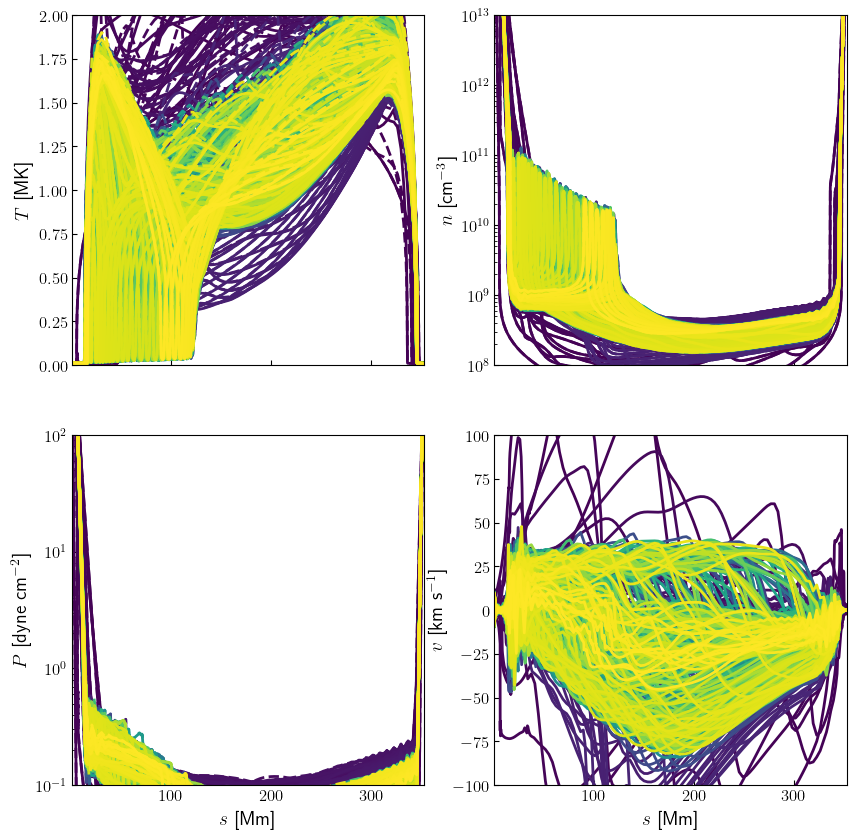

In [99]:
run_8_strand.peek(limits={'temperature': [0,2]})

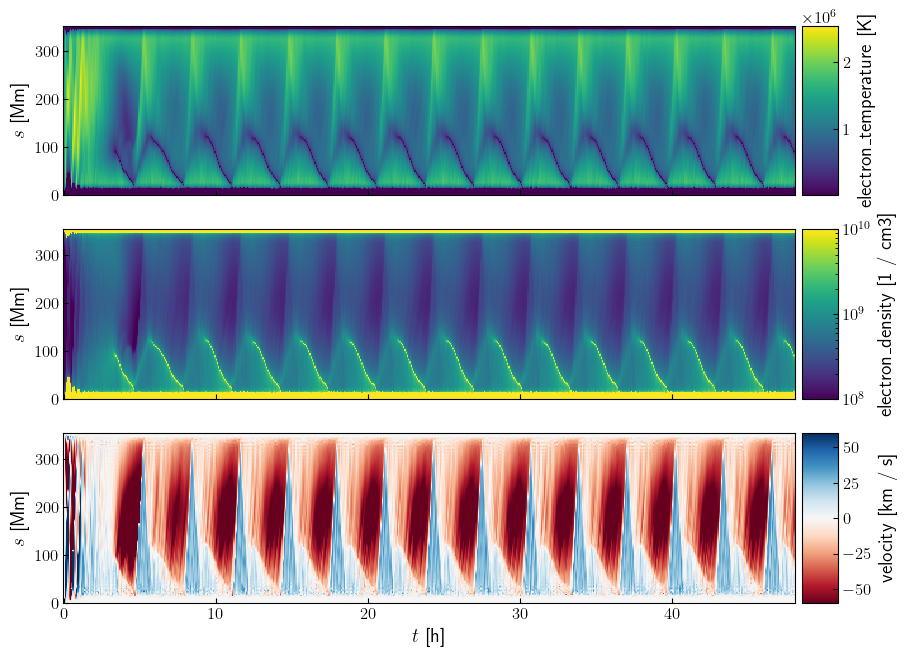

In [100]:
run_8_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
    time_unit='h',
    space_unit='Mm',
)

## Run 9: Asymmetry of 0.25 w/ expansion

In [101]:
run_9_config = config_from_bundle(hydrad_config, bundle, include_expansion=True, include_gravity=True)
run_9_config['general']['total_time'] = 2 * u.day
run_9_config['heating']['background']['use_initial_conditions'] = False
run_9_config['heating']['background']['rate'] = 0 * u.Unit('erg cm-3 s-1')
run_9_config['heating']['background']['location'] = 0 * u.cm
run_9_config['heating']['background']['scale_height'] = 1e300 * u.cm
run_9_config['heating']['events'] = configure_footpoint_heating(run_9_config,
                                                                q_0,
                                                                sh_ratio=scale_height_ratio,
                                                                deposition_ratio=deposition_ratio,
                                                                fp_ratio=0.25)
c = Configure(run_9_config)
c.setup_simulation('model_data/hydrad_runs/run_9',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szGravityTableFilename, "%s.table", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/main.cpp:92:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szGravityFilename, "%s.gravity", Params.szOutp

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 8.1283e-06 -> 8.3176e-06 erg cm^-3 s^-1

Optimum peak heating rate = 8.1593e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [103]:
run_9_strand = Strand('model_data/hydrad_runs/run_9/')

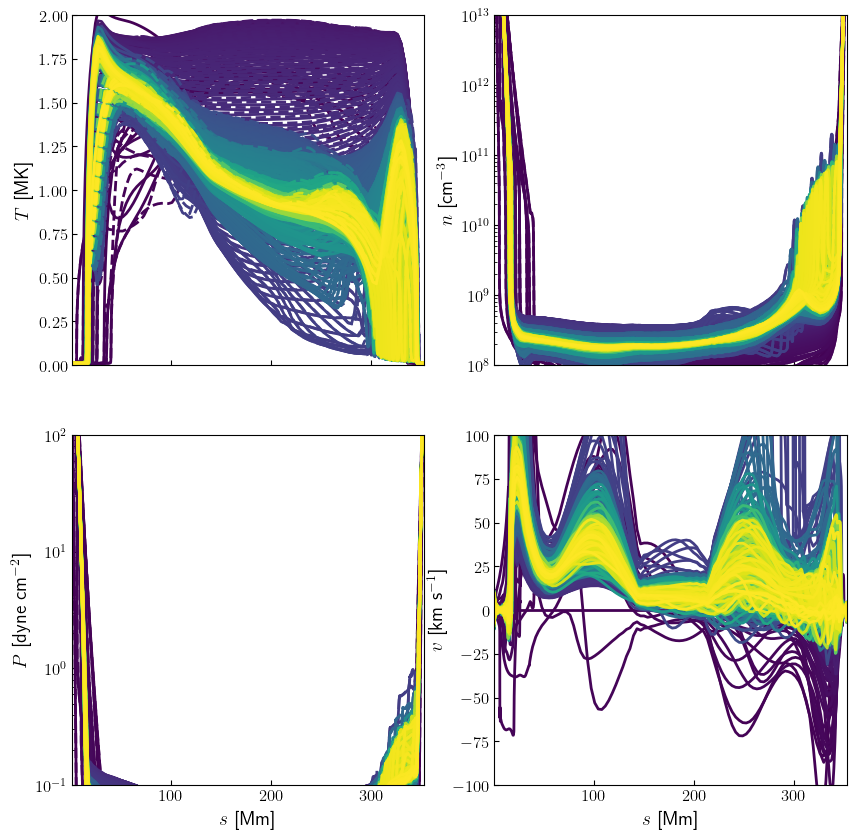

In [104]:
run_9_strand.peek(limits={'temperature': [0,2]})

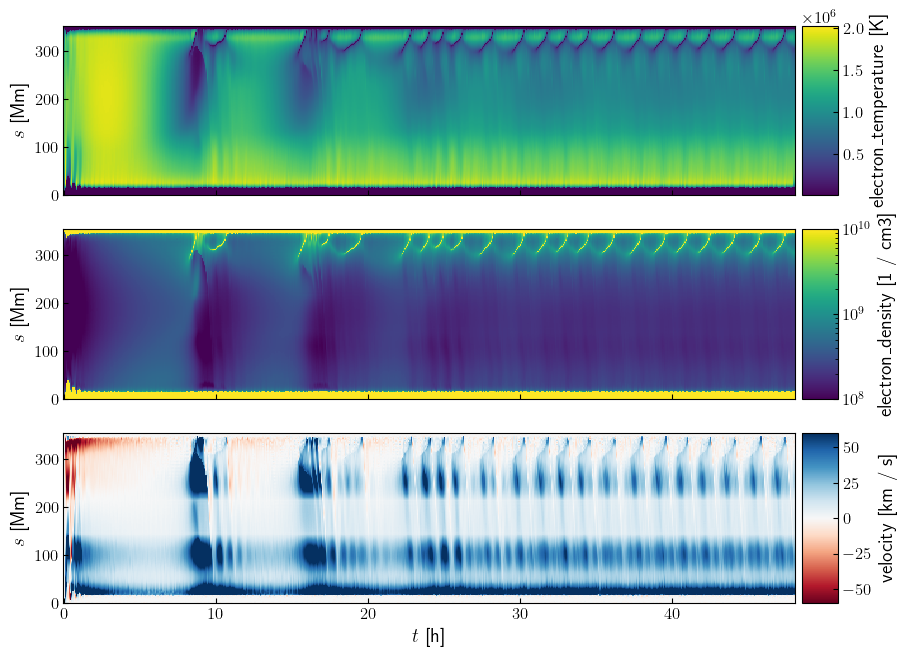

In [105]:
run_9_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
    time_unit='h',
    space_unit='Mm',
)

## Run 10: Asymmetry of 0.3 w/o Expansion

In [102]:
run_10_config = config_from_bundle(hydrad_config, bundle, include_expansion=False, include_gravity=True)
run_10_config['general']['total_time'] = 2 * u.day
run_10_config['heating']['background']['use_initial_conditions'] = False
run_10_config['heating']['background']['rate'] = 0 * u.Unit('erg cm-3 s-1')
run_10_config['heating']['background']['location'] = 0 * u.cm
run_10_config['heating']['background']['scale_height'] = 1e300 * u.cm
run_10_config['heating']['events'] = configure_footpoint_heating(run_10_config,
                                                                q_0,
                                                                sh_ratio=scale_height_ratio,
                                                                deposition_ratio=deposition_ratio,
                                                                fp_ratio=0.3)
c = Configure(run_10_config)
c.setup_simulation('model_data/hydrad_runs/run_10',
                   '/Users/wtbarnes/Documents/codes/HYDRAD/',
                   run_initial_conditions=True,
                   overwrite=True)

sprintf( szGravityTableFilename, "%s.table", Params.szOutputFilename );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explicitly marked deprecated here
__deprecated_msg("This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead.")
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/sys/cdefs.h:215:48: note: expanded from macro '__deprecated_msg'
        #define __deprecated_msg(_msg) __attribute__((__deprecated__(_msg)))
                                                      ^
../source/main.cpp:92:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szGravityFilename, "%s.gravity", Params.szOutp

INFO: 

Calculating initial hydrostatic conditions...

Peak heating range = 8.1283e-06 -> 8.3176e-06 erg cm^-3 s^-1

Optimum peak heating rate = 8.1593e-06 erg cm^-3 s^-1

Writing initial conditions file...

Done!

 [pydrad.configure.util]


In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
1 warning generated.
In file included from ../source/mesh.cpp:17:
In file included from ../source/mesh.h:13:
../source/eqns.h:38:31: warning: default member initializer for non-static data member is a C++11 extension [-Wc++11-extensions]
    double Tc, Te_max, old_Tc = 0.0;
                              ^
../source/mesh.cpp:1866:1: warning: 'sprintf' is deprecated: This function is provided for compatibility reasons only.  Due to security concerns inherent in the design of sprintf(3), it is highly recommended that you use snprintf(3) instead. [-Wdeprecated-declarations]
sprintf( szPhysicalFilename, "Results/profile%i.phy", iFileNumber );
^
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/stdio.h:188:1: note: 'sprintf' has been explici

In [106]:
run_10_strand = Strand('model_data/hydrad_runs/run_10/')

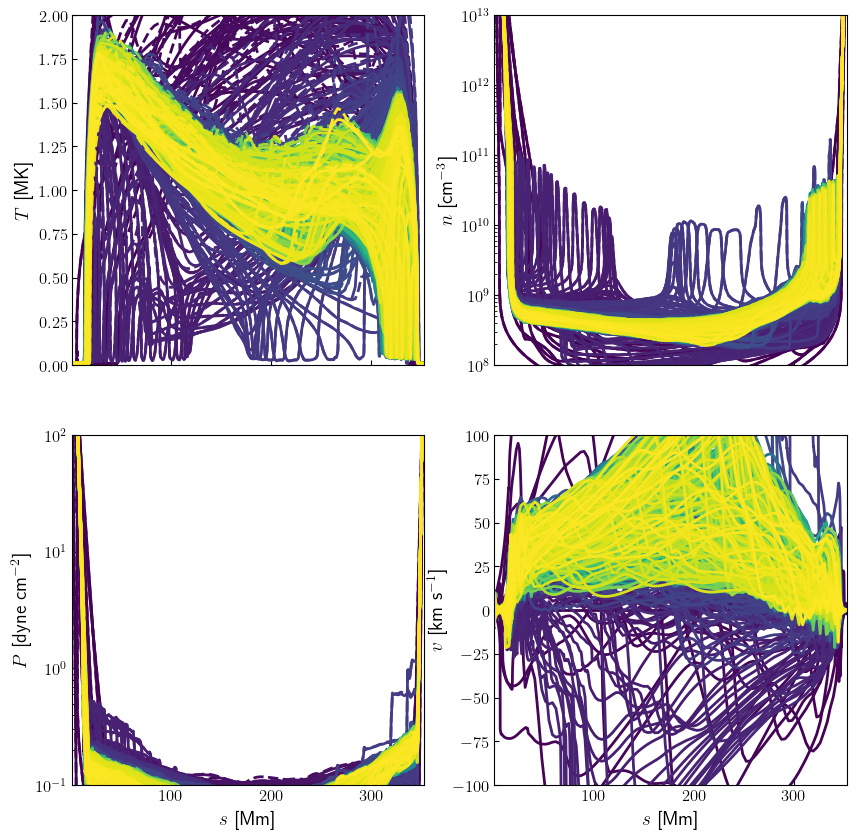

In [107]:
run_10_strand.peek(limits={'temperature': [0,2]})

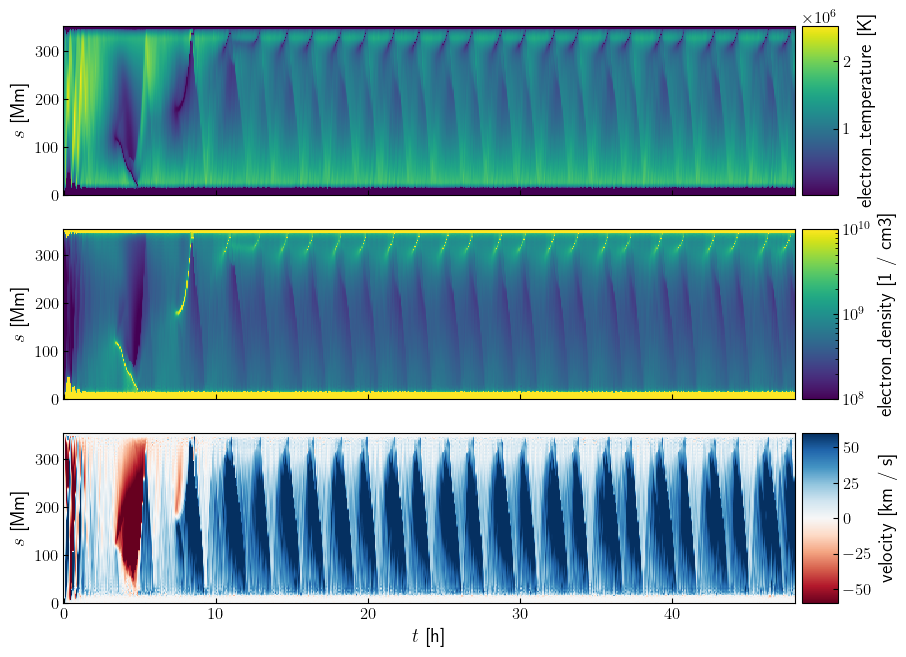

In [108]:
run_10_strand.peek_time_distance(
    norm={'electron_density': LogNorm(vmin=1e8, vmax=1e10),
          'velocity': Normalize(vmin=-60, vmax=60)},
    cmap={'velocity': 'RdBu'},
    units={'velocity': 'km/s'},
    time_unit='h',
    space_unit='Mm',
)

## Run ???: Impulsive Heating

No idea how I'm going to parameterize this yet...

In [50]:
hydrad_config

{'asdf_library': {'author': 'Space Telescope Science Institute',
  'homepage': 'http://github.com/spacetelescope/asdf',
  'name': 'asdf',
  'version': '2.7.1'},
 'history': {'extensions': [{'extension_class': 'asdf.extension.BuiltinExtension',
    'software': {'name': 'asdf', 'version': '2.7.1'}},
   {'extension_class': 'astropy.io.misc.asdf.extension.AstropyAsdfExtension',
    'software': {'name': 'astropy', 'version': '4.2'}}]},
 'general': {'footpoint_height': <Quantity 5. Mm>,
  'force_single_fluid': False,
  'heat_flux_limiting_coefficient': 0.167,
  'heat_flux_timestep_limit': <Quantity 1.e-05 s>,
  'logging_frequency': 1000,
  'loop_inclination': <Quantity 0. deg>,
  'minimum_collisional_coupling_timescale': <Quantity 0.01 s>,
  'output_interval': <Quantity 1. min>,
  'use_kinetic_model': False,
  'write_file_equation_terms': False,
  'write_file_hydrogen_level_populations': False,
  'write_file_ion_populations': False,
  'write_file_physical': True,
  'write_file_timescales': F